## Labels Visualization of the PubTables-1M dataset for the table recognition task

f PMC5828443_table_0.json
f PMC3549283_table_0.json
f PMC2838822_table_1.json
f PMC3594319_table_0.json
f PMC6126397_table_0.json
f PMC5109288_table_1.json
f PMC4706617_table_3.json
f PMC5668063_table_0.json
f PMC4357428_table_1.json
f PMC4978967_table_0.json


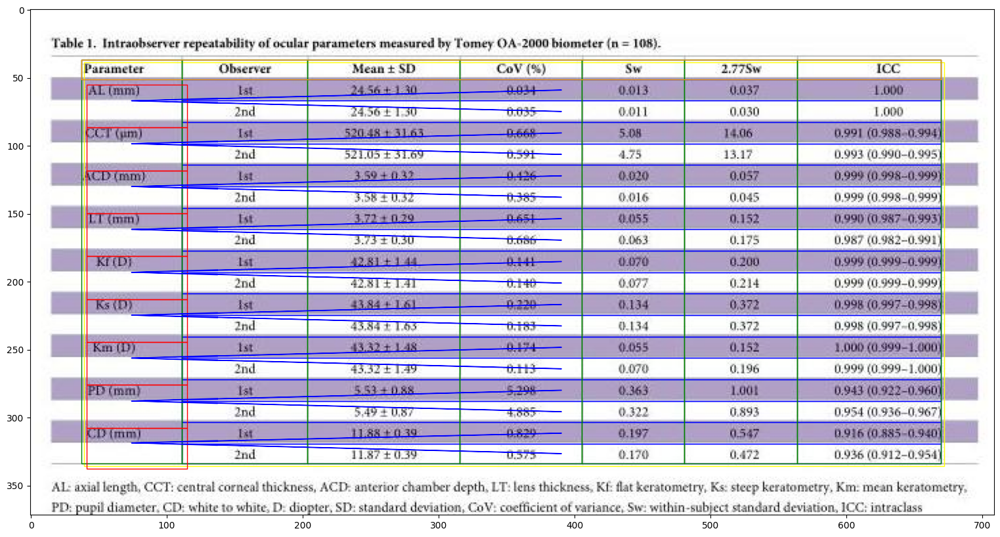

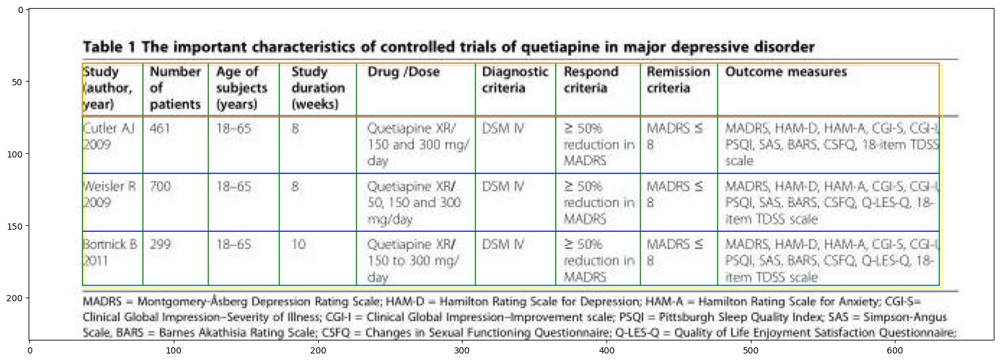

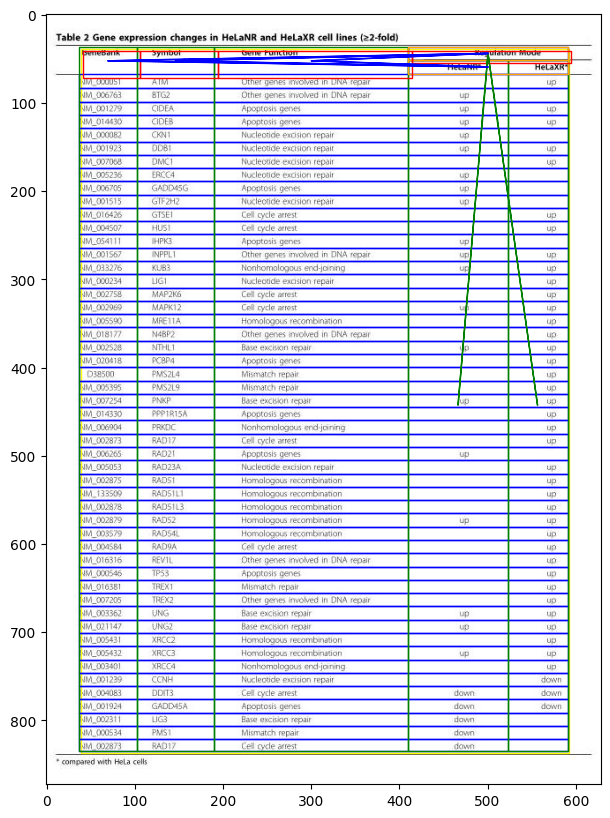

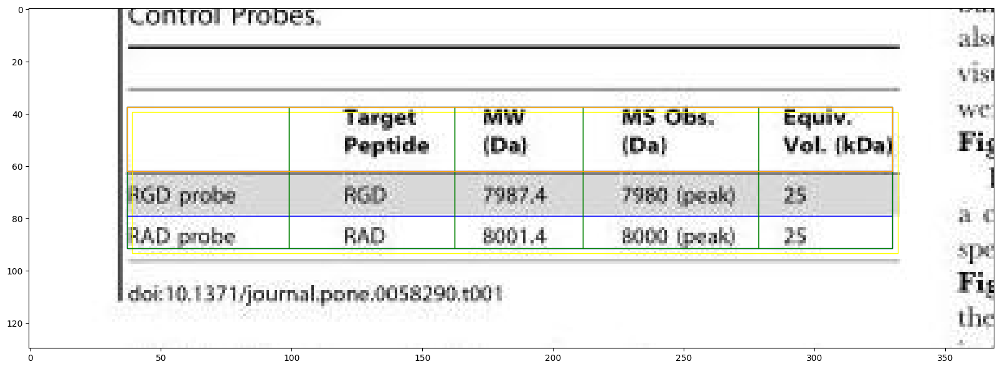

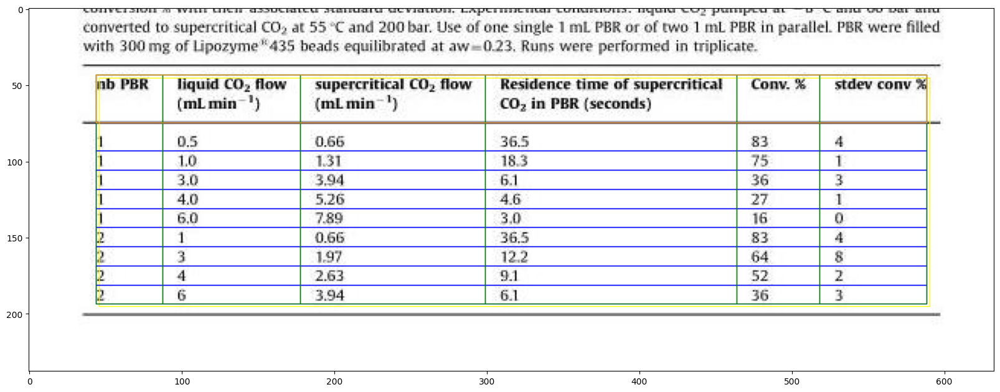

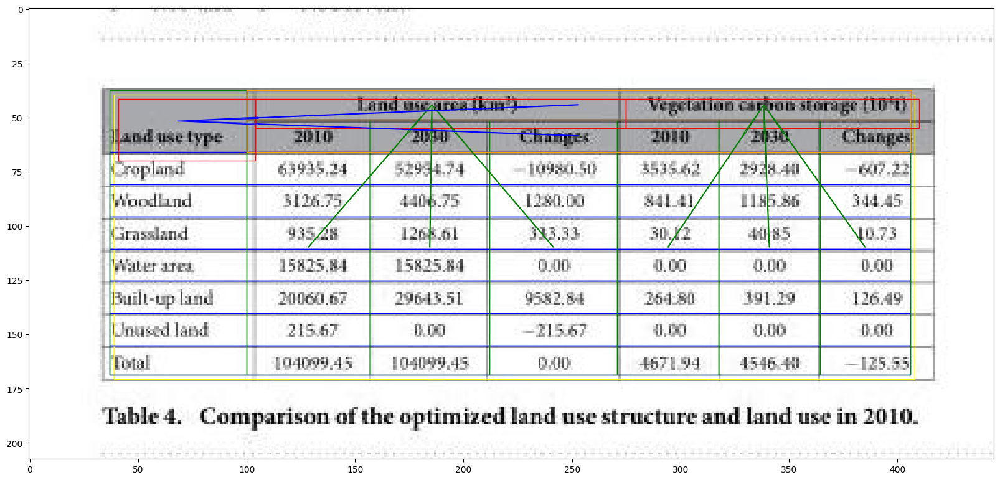

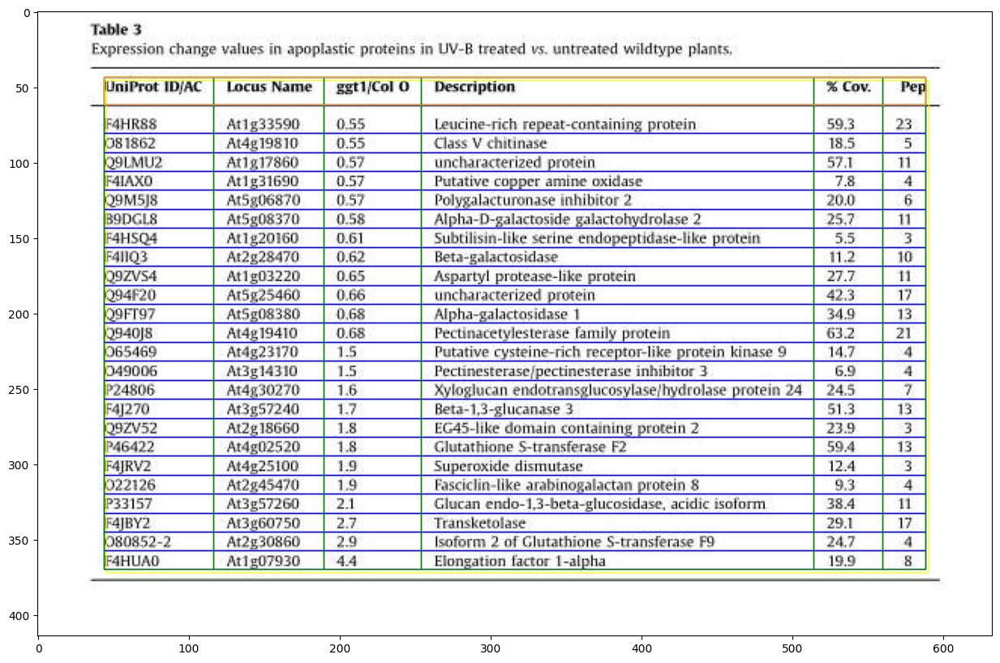

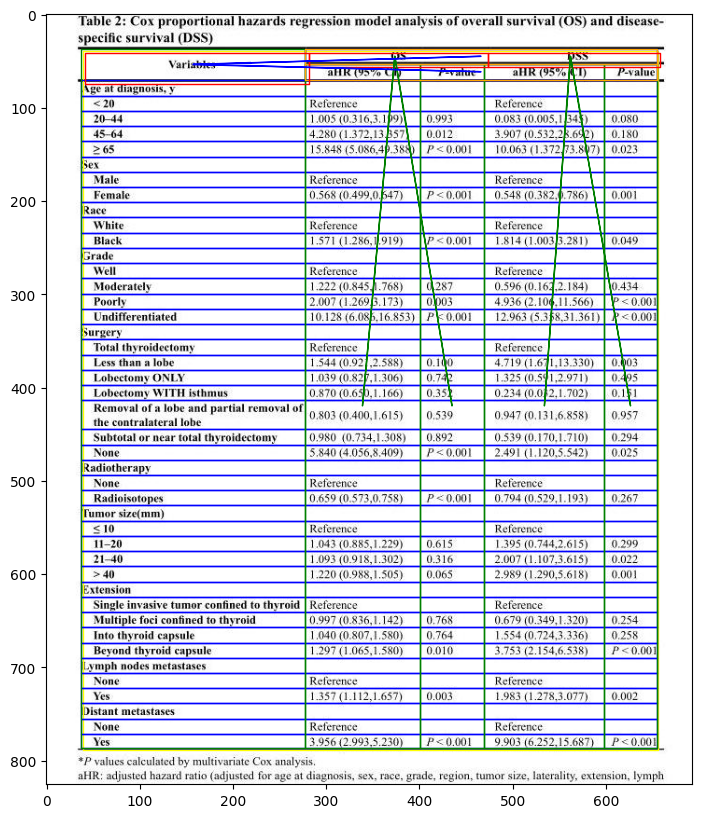

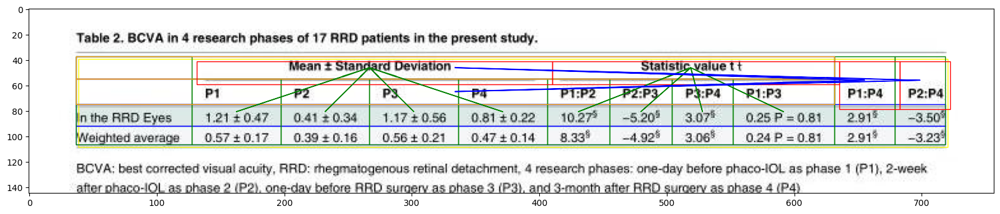

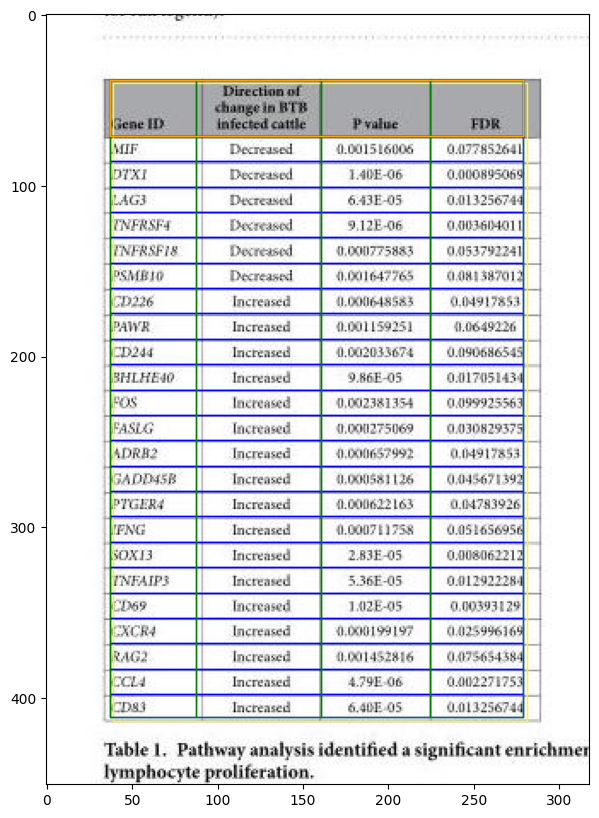

In [9]:
# labels visualization

import os
import sys
import json
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.patches import Rectangle, Polygon, Arrow
from matplotlib.collections import PatchCollection
from PIL import Image
import xml.etree.ElementTree as ET
import glob
from collections import defaultdict



def read_json(json_file: str, class_map=None):
    with open(json_file, 'r') as openfile:
        data = json.load(openfile)
    width, height = data['image_size']
    bboxes = []
    labels = []
    cell_pointers = []

    for label in data['labels']:
        label_name = label['name']
        bbox = label['bbox']

        if bbox[2] <= bbox[0] or bbox[3] <= bbox[1]:
            print('wrong bbox coord', bbox)
            print(label_name)

        cell_pointer = label.get('extra_cells', None)

        if label_name == 'table rotated':
            label_name = 'table'

        if class_map.get(label_name, None) is None:
            continue

        label_id = int(class_map[label_name])
        bboxes.append(bbox)
        labels.append(label_id)
        cell_pointers.append(cell_pointer)

    return bboxes, labels, cell_pointers, [width, height]


dataset_type = 'test'
# path of downloaded the Pubtables1m dataset
dataset_path = os.path.join('/home/ec2-user/efs/chargrid_ocr/PubTables-1M/pubtables-1m/pubtables1m/PubTables1M-Structure-PASCAL-VOC', dataset_type)


class_map = {'table': 0,
             'column': 1,
             'row': 2,
             'header': 3,
             'spanning cell': 4}

for f in os.listdir(dataset_path)[:10]:
    print('f', f)
    if f == '.ipynb_checkpoints':
        continue

    file_name = f.split('.')[0]
    annotation_file_path = os.path.join(dataset_path, f)
    bboxes, labels, cell_pointers, size = read_json(annotation_file_path, class_map)

    image_path = os.path.join(dataset_path, '..', 'images', file_name + '.jpg')
    if not os.path.exists(image_path):
        image_path = os.path.join(dataset_path, '..', 'images', file_name + '.png')
    
    im = Image.open(image_path)
    fig, ax = plt.subplots(figsize=(20, 10))
    ax.imshow(im)
    header_rects = []
    row_rects = []
    col_rects = []
    table_rects = []
    cell_rects = []
    col_arrows = []
    row_arrows = []

    for idx, bbox in enumerate(bboxes):
        if labels[idx] == 0:
            shift = 2
        elif labels[idx] == 4:
            shift = 4
        else:
            shift = 0

        rect = Polygon(np.asarray([[bbox[0] + shift, bbox[1] + shift], [bbox[2] + shift, bbox[1] + shift],
                                   [bbox[2] + shift, bbox[3] + shift], [bbox[0] + shift, bbox[3] + shift]]).reshape(-1, 2))
        if labels[idx] == 0:
            table_rects.append(rect)
        elif labels[idx] == 1:
            col_rects.append(rect)
        elif labels[idx] == 2:
            row_rects.append(rect)
        elif labels[idx] == 3:
            header_rects.append(rect)
        elif labels[idx] == 4:
            cell_rects.append(rect)
        
        if labels[idx] == 1:
            if cell_pointers[idx]:
                for dst_cell in cell_pointers[idx]:
                    if dst_cell:
                        dst_cell_x_center = (dst_cell[0] + dst_cell[2]) / 2.0
                        dst_cell_y_center = (dst_cell[1] + dst_cell[3]) / 2.0
                        column_x_center = (bbox[0] + bbox[2]) / 2.0
                        column_y_center = (bbox[1] + bbox[3]) / 2.0
                        arrow = Arrow(column_x_center, column_y_center, dst_cell_x_center-column_x_center, dst_cell_y_center-column_y_center)
                        col_arrows.append(arrow)

        if labels[idx] == 2:
            if cell_pointers[idx]:
                for dst_cell in cell_pointers[idx]:
                    if dst_cell:
                        dst_cell_x_center = (dst_cell[0] + dst_cell[2]) / 2.0
                        dst_cell_y_center = (dst_cell[1] + dst_cell[3]) / 2.0
                        row_x_center = (bbox[0] + bbox[2]) / 2.0
                        row_y_center = (bbox[1] + bbox[3]) / 2.0
                        arrow = Arrow(row_x_center, row_y_center, dst_cell_x_center-row_x_center, dst_cell_y_center-row_y_center)
                        row_arrows.append(arrow)

    ax.add_collection(PatchCollection(table_rects, facecolor='none', edgecolor='yellow'))
    ax.add_collection(PatchCollection(row_rects, facecolor='none', edgecolor='blue'))
    ax.add_collection(PatchCollection(col_rects, facecolor='none', edgecolor='green'))
    ax.add_collection(PatchCollection(header_rects, facecolor='none', edgecolor='orange'))

    ax.add_collection(PatchCollection(cell_rects, facecolor='none', edgecolor='red'))
    ax.add_collection(PatchCollection(col_arrows, facecolor='none', edgecolor='green'))
    ax.add_collection(PatchCollection(row_arrows, facecolor='none', edgecolor='blue'))


## Labels Visualization of the PubTables-1M dataset for table detection and table recognition tasks

100%|██████████| 10/10 [00:01<00:00,  9.69it/s]


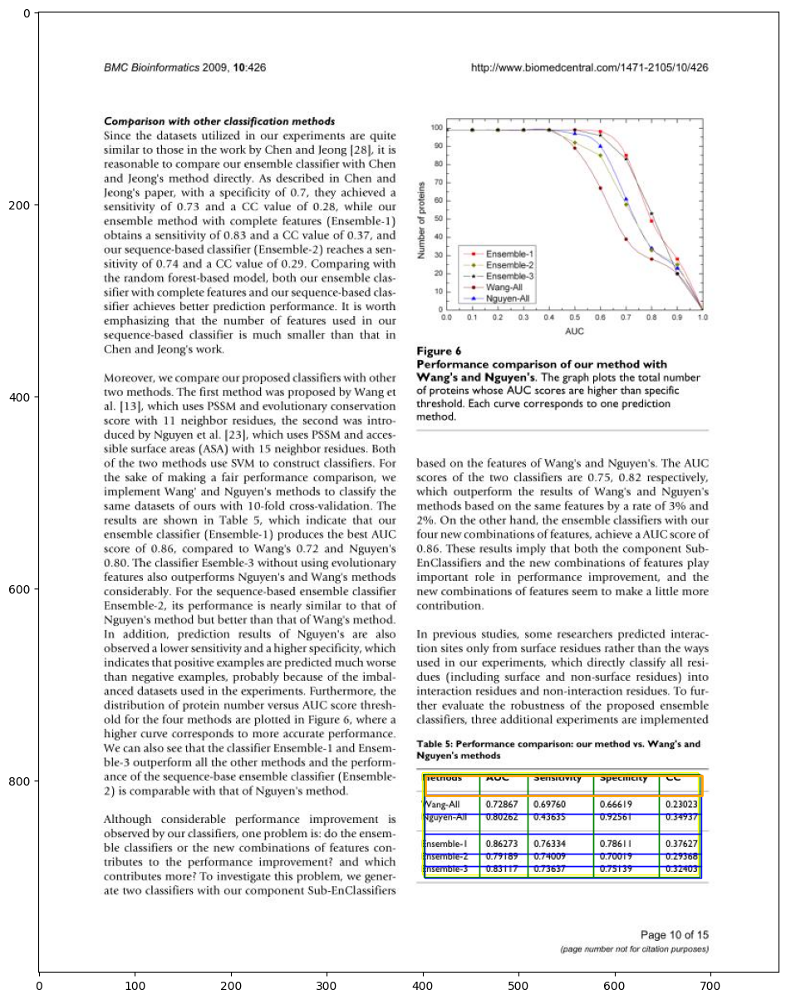

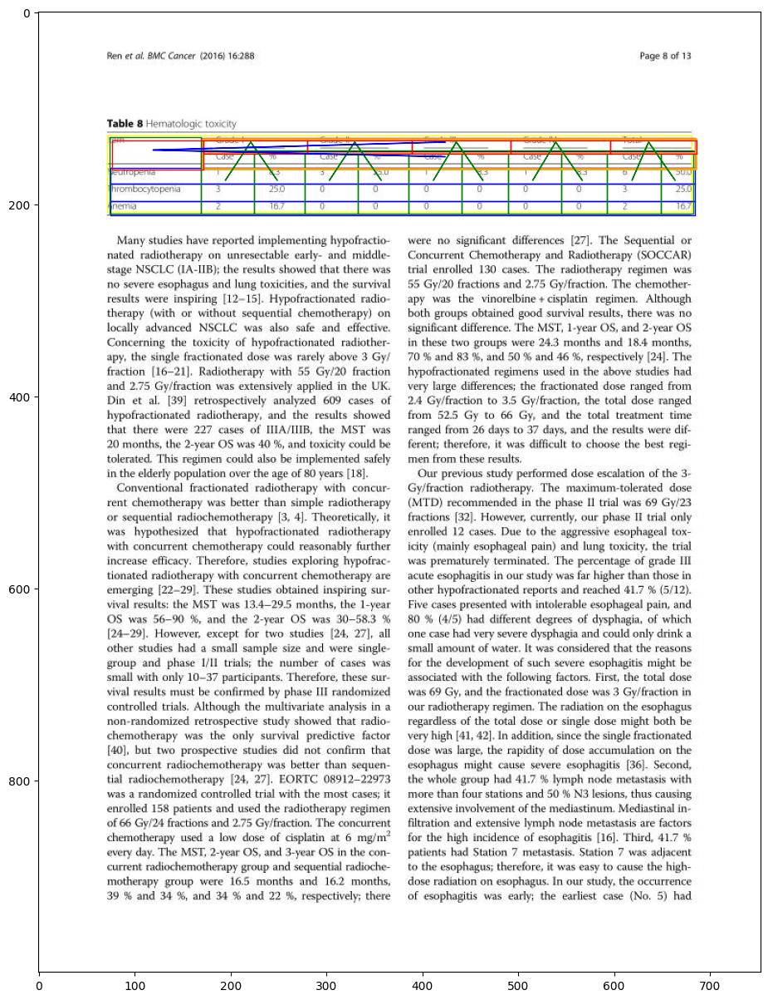

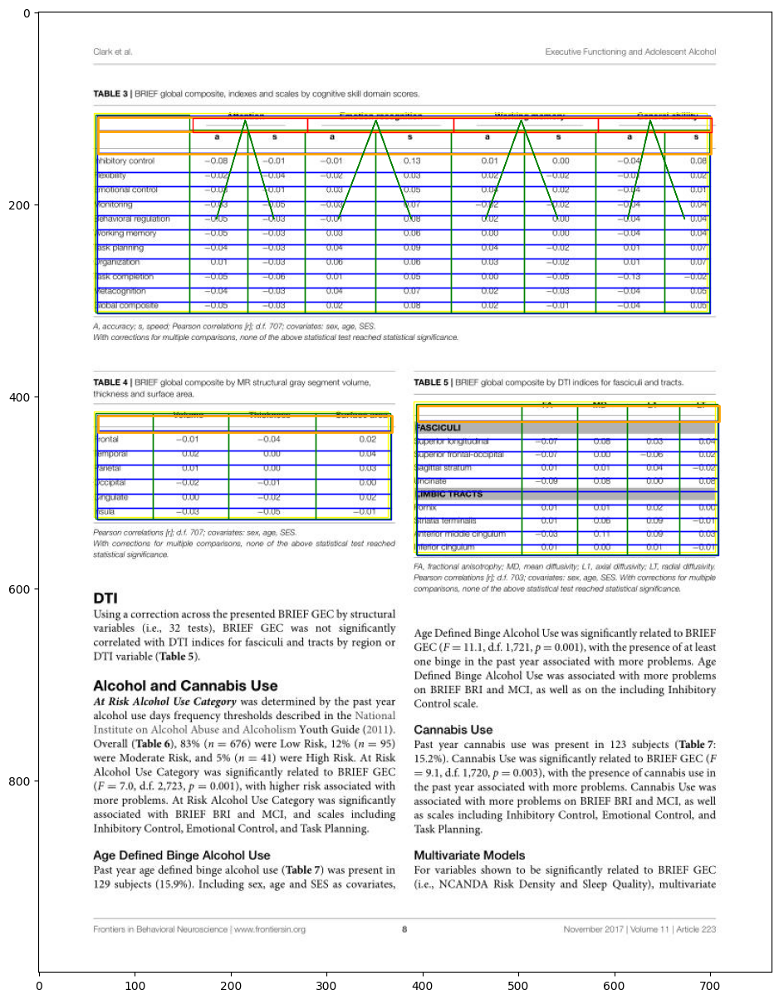

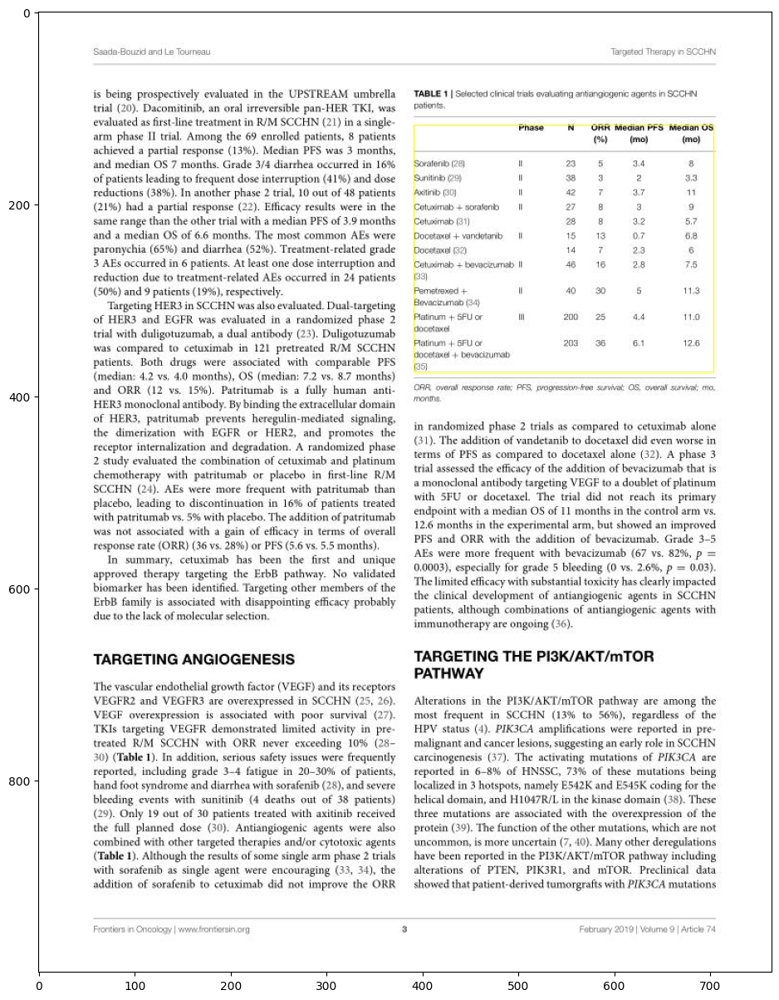

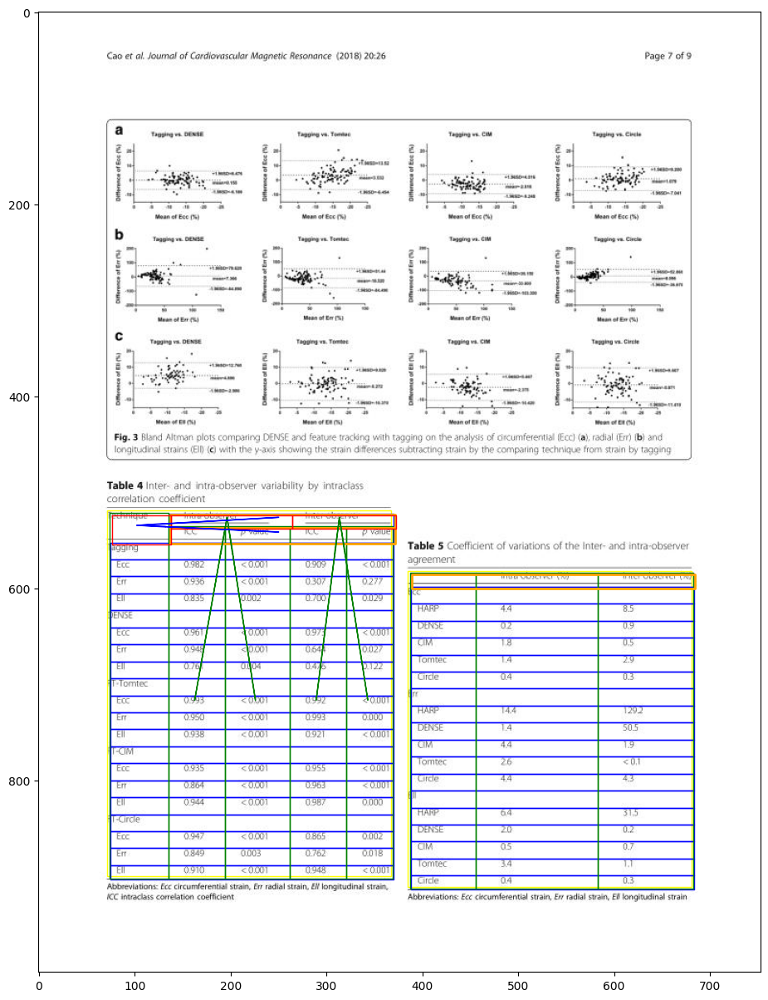

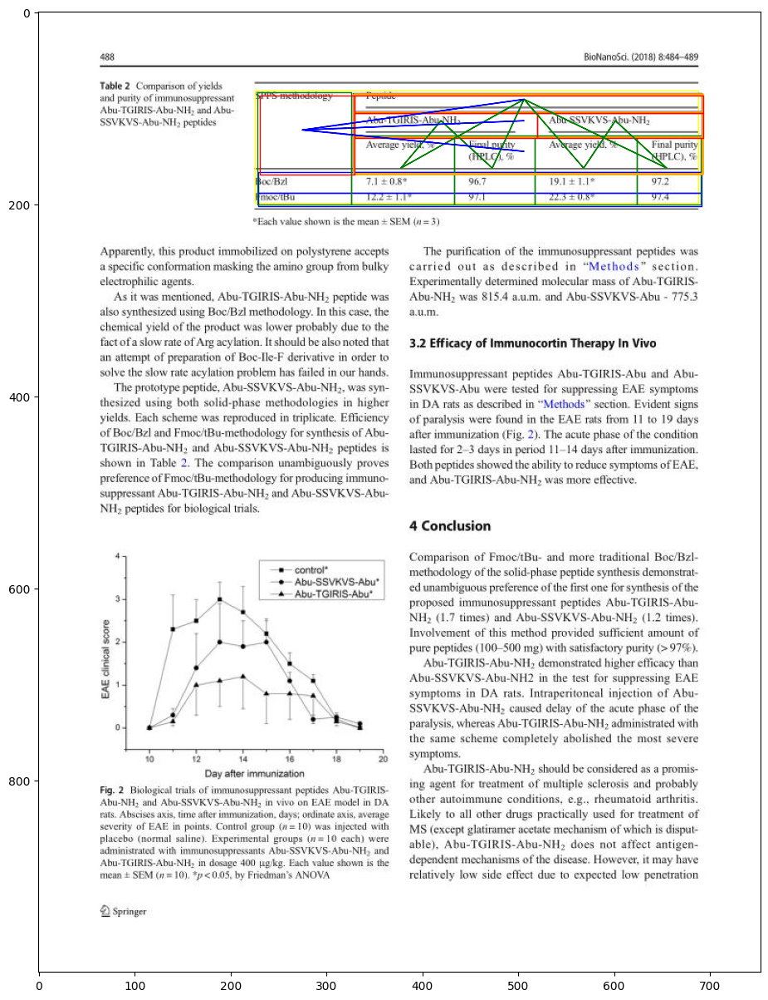

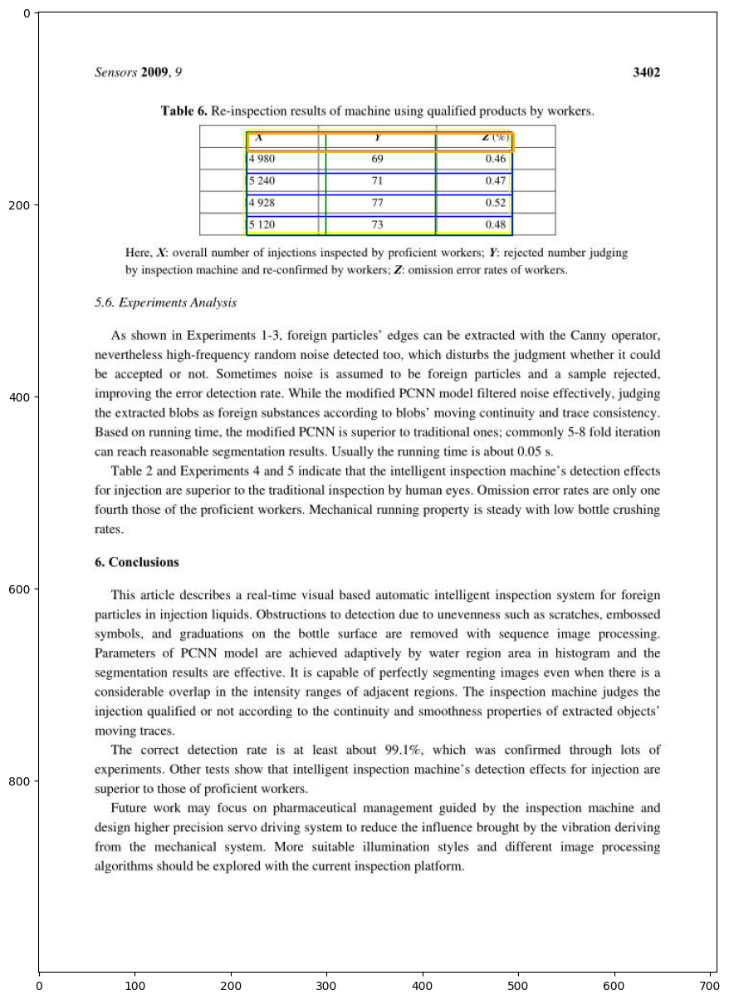

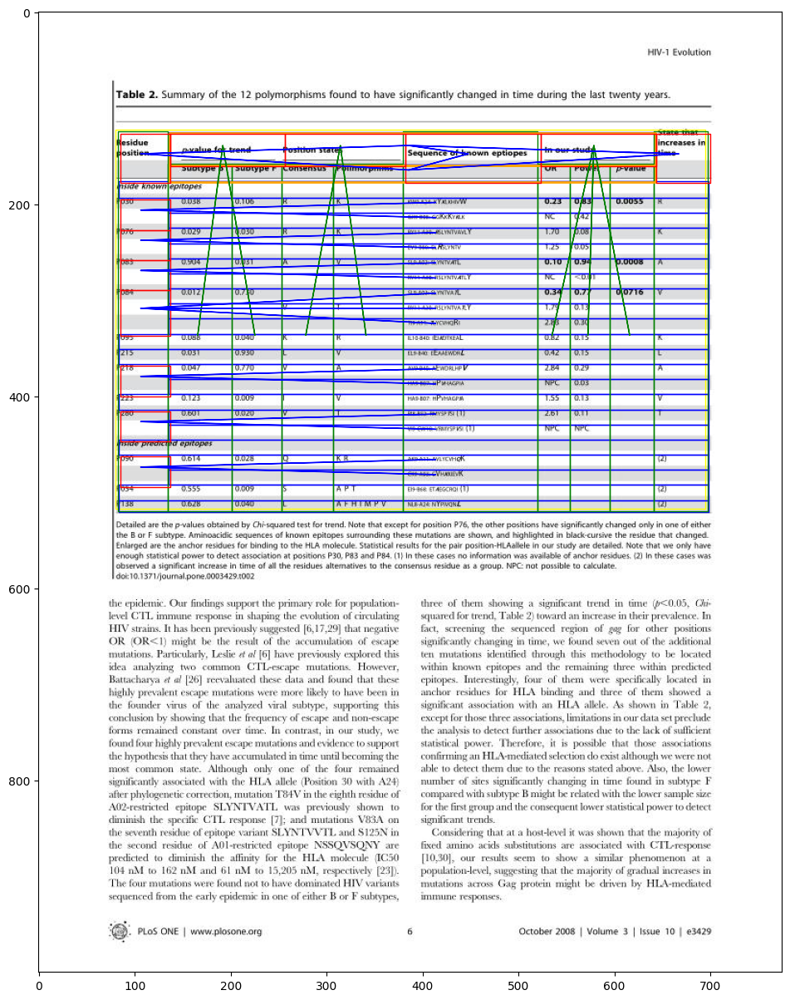

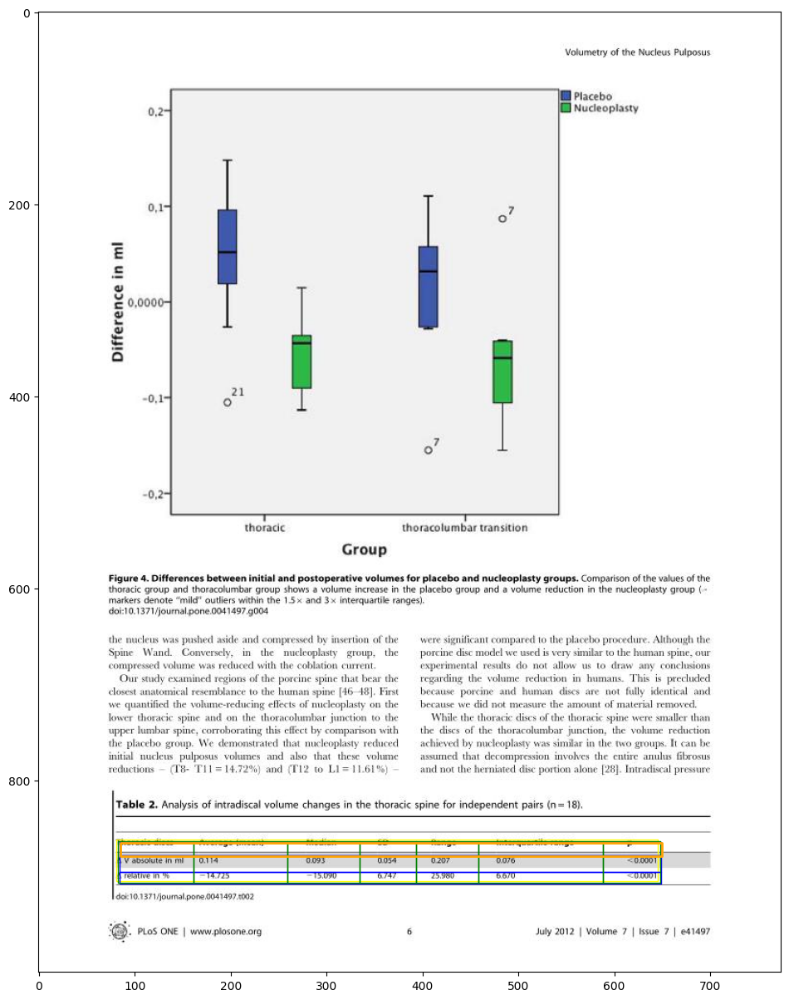

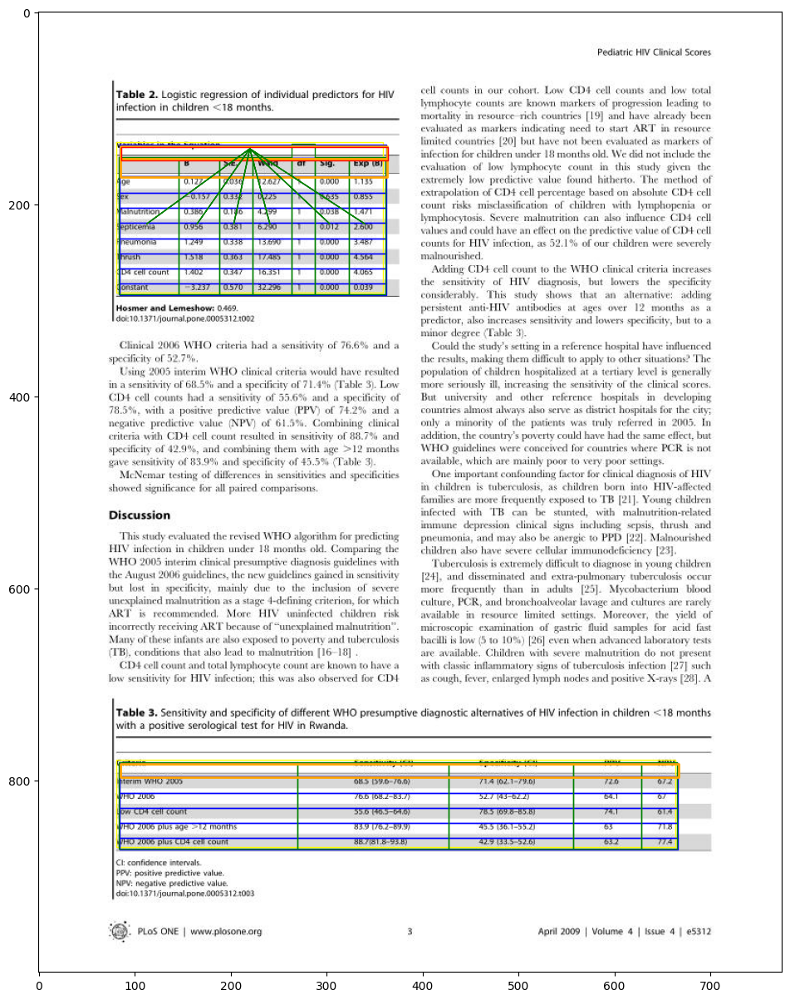

In [2]:
# Labels visualization for table detection + recognition with correspondance dict

import os
import sys
import json
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.patches import Rectangle, Polygon, Arrow
from matplotlib.collections import PatchCollection
from PIL import Image
import xml.etree.ElementTree as ET
import glob
from collections import defaultdict
from tqdm import tqdm



with open('td_to_tr_matching_ocr_gt.json', 'r', encoding="utf8") as f:
    td_to_tr_matching = json.load(f)

is_one_model = True
dataset_type = 'train'

class_map = {'table': 0,
             'column': 1,
             'row': 2,
             'header': 3,
             'spanning cell': 4}

def read_json(json_file: str, class_map=None):
    with open(json_file, 'r') as openfile:
        data = json.load(openfile)
    width, height = data['image_size']
    bboxes = []
    labels = []
    cell_pointers = []

    for label in data['labels']:
        label_name = label['name']
        bbox = label['bbox']
        cell_pointer = label.get('extra_cells', None)

        if label_name == 'table rotated':
            label_name = 'table'

        if class_map.get(label_name, None) is None:
            continue

        label_id = int(class_map[label_name])
        bboxes.append(bbox)
        labels.append(label_id)
        cell_pointers.append(cell_pointer)

    return bboxes, labels, cell_pointers, [width, height]


def map_tr_on_td_dataset_point(root, page_id, bboxes, labels, cell_pointers):
    shadow_mask = 1
    if 'PubTables1M-Detection-PASCAL-VOC' in root and is_one_model:
        corresponding_tr_ids = td_to_tr_matching.get(page_id, None)
        if corresponding_tr_ids is not None:
            root_tr = root.replace('PubTables1M-Detection-PASCAL-VOC', 'PubTables1M-Structure-PASCAL-VOC')
            for tr_idx, table_id in enumerate(corresponding_tr_ids):
                bs_tr, ls_tr, structure_cell_pointers, image_size_tr = read_json(os.path.join(root_tr, dataset_type, table_id + '.json'), class_map)
                table_label_index = ls_tr.index(0)
                box_tr_reference = bs_tr[table_label_index]

                for b, l, cp in zip(bs_tr, ls_tr, structure_cell_pointers):
                    if l == 0:
                        continue
                    box_tr_mapped = [b[0] + bboxes[tr_idx][0] - box_tr_reference[0], b[1] + bboxes[tr_idx][1] - box_tr_reference[1],
                                     b[2] + bboxes[tr_idx][0] - box_tr_reference[0], b[3] + bboxes[tr_idx][1] - box_tr_reference[1]]
                    bboxes.append(box_tr_mapped)
                    labels.append(l)
                    new_cp = None
                    if cp is not None and cp != []:
                        new_cp = []
                        for cp_single in cp:
                            cp_single_mapped = [cp_single[0] + bboxes[tr_idx][0] - box_tr_reference[0], cp_single[1] + bboxes[tr_idx][1] - box_tr_reference[1],
                                                cp_single[2] + bboxes[tr_idx][0] - box_tr_reference[0], cp_single[3] + bboxes[tr_idx][1] - box_tr_reference[1]]
                            new_cp.append(cp_single_mapped)
                    cell_pointers.append(new_cp)
        else:
            shadow_mask = 0
    return shadow_mask, bboxes, labels, cell_pointers


dataset_type = 'test'
# path of downloaded the Pubtables1m dataset
dataset_path = '/home/ec2-user/efs/chargrid_ocr/PubTables-1M/pubtables-1m/pubtables1m/PubTables1M-Detection-PASCAL-VOC'


for f in tqdm(os.listdir(os.path.join(dataset_path, dataset_type))[:10]):
    # print(f)
    if f == '.ipynb_checkpoints':
        continue

    file_name = f.split('.')[0]
    annotation_file_path = os.path.join(dataset_path, dataset_type, f)
    bboxes, labels, cell_pointers, size = read_json(annotation_file_path, class_map)

    image_path = os.path.join(dataset_path, dataset_type, '..', 'images', file_name + '.jpg')
    if not os.path.exists(image_path):
        image_path = os.path.join(dataset_path, dataset_type, '..', 'images', file_name + '.png')

    im = Image.open(image_path)
    fig, ax = plt.subplots(figsize=(30, 15))
    ax.imshow(im)
    header_rects = []
    row_rects = []
    col_rects = []
    table_rects = []
    cell_rects = []
    col_arrows = []
    row_arrows = []

    shadow_mask, bboxes, labels, cell_pointers = map_tr_on_td_dataset_point(dataset_path, file_name, bboxes, labels, cell_pointers)
    for idx, bbox in enumerate(bboxes):
        shift = 0
        if labels[idx] > 0:
            shift = labels[idx] + 1
        rect = Polygon(np.asarray([[bbox[0] + shift, bbox[1] + shift], [bbox[2] + shift, bbox[1] + shift],
                                   [bbox[2] + shift, bbox[3] + shift], [bbox[0] + shift, bbox[3] + shift]]).reshape(-1, 2))
        if labels[idx] == 0:
            table_rects.append(rect)
        elif labels[idx] == 1:
            col_rects.append(rect)
        elif labels[idx] == 2:
            row_rects.append(rect)
        elif labels[idx] == 3:
            header_rects.append(rect)
        elif labels[idx] == 4:
            cell_rects.append(rect)

        if labels[idx] == 1:
            if cell_pointers[idx]:
                for dst_cell in cell_pointers[idx]:
                    if dst_cell:
                        dst_cell_x_center = (dst_cell[0] + dst_cell[2]) / 2.0
                        dst_cell_y_center = (dst_cell[1] + dst_cell[3]) / 2.0
                        column_x_center = (bbox[0] + bbox[2]) / 2.0
                        column_y_center = (bbox[1] + bbox[3]) / 2.0
                        arrow = Arrow(column_x_center, column_y_center, dst_cell_x_center-column_x_center, dst_cell_y_center-column_y_center)
                        col_arrows.append(arrow)

        if labels[idx] == 2:
            if cell_pointers[idx]:
                for dst_cell in cell_pointers[idx]:
                    if dst_cell:
                        dst_cell_x_center = (dst_cell[0] + dst_cell[2]) / 2.0
                        dst_cell_y_center = (dst_cell[1] + dst_cell[3]) / 2.0
                        row_x_center = (bbox[0] + bbox[2]) / 2.0
                        row_y_center = (bbox[1] + bbox[3]) / 2.0
                        arrow = Arrow(row_x_center, row_y_center, dst_cell_x_center-row_x_center, dst_cell_y_center-row_y_center)
                        row_arrows.append(arrow)

    ax.add_collection(PatchCollection(table_rects, facecolor='none', edgecolor='yellow', linewidth=1))
    ax.add_collection(PatchCollection(row_rects, facecolor='none', edgecolor='blue', linewidth=1))
    ax.add_collection(PatchCollection(col_rects, facecolor='none', edgecolor='green', linewidth=1))
    ax.add_collection(PatchCollection(header_rects, facecolor='none', edgecolor='orange', linewidth=2))
    ax.add_collection(PatchCollection(cell_rects, facecolor='none', edgecolor='red', linewidth=1))

    ax.add_collection(PatchCollection(col_arrows, facecolor='none', edgecolor='green'))
    ax.add_collection(PatchCollection(row_arrows, facecolor='none', edgecolor='blue'))
